In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 256), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  617.243 2.81447 0.297174


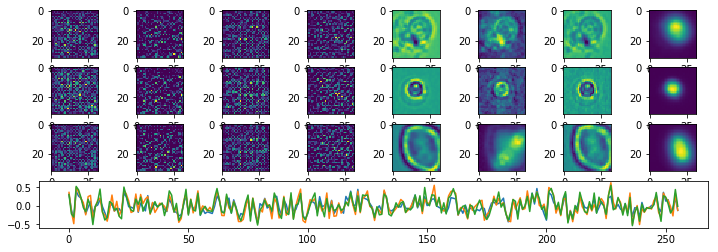

Epoch:  1 Iteration:  0 Loss:  20.3924 0.63884 0.00130588


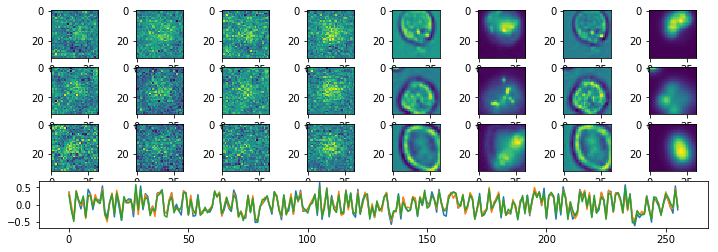

Epoch:  2 Iteration:  0 Loss:  14.9126 0.635972 0.00160313


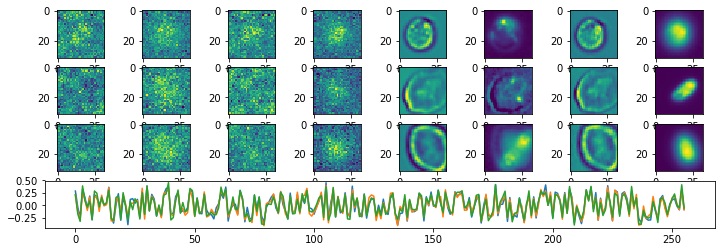

Epoch:  3 Iteration:  0 Loss:  13.0444 0.634998 0.00212654


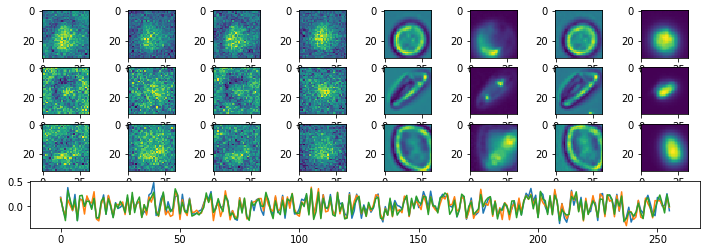

Epoch:  4 Iteration:  0 Loss:  12.2043 0.634587 0.00241452


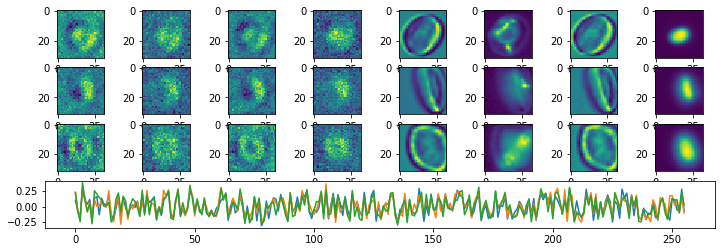

Epoch:  5 Iteration:  0 Loss:  10.8233 0.633847 0.00125301


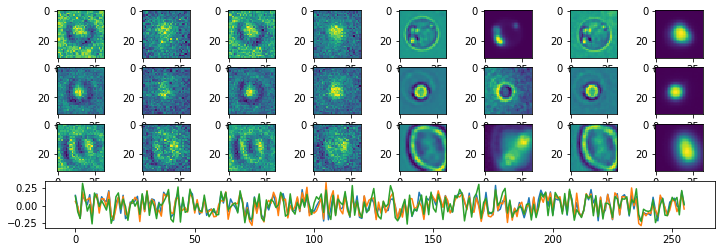

Epoch:  6 Iteration:  0 Loss:  9.86323 0.633352 0.00225475


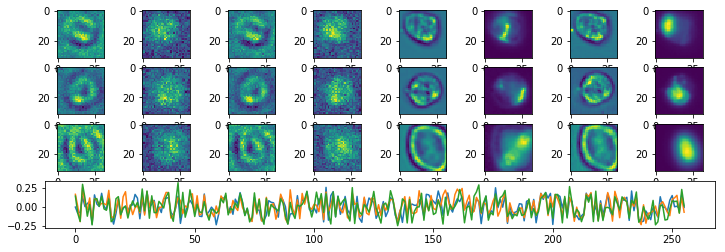

Epoch:  7 Iteration:  0 Loss:  8.76537 0.632758 0.000836343


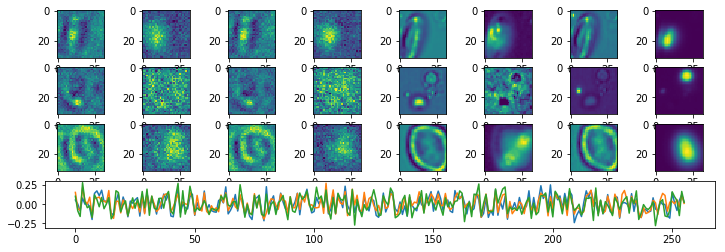

Epoch:  8 Iteration:  0 Loss:  8.1983 0.632471 0.00178251


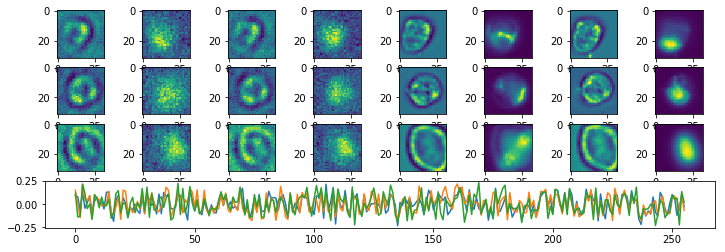

Epoch:  9 Iteration:  0 Loss:  7.63173 0.632166 0.000572413


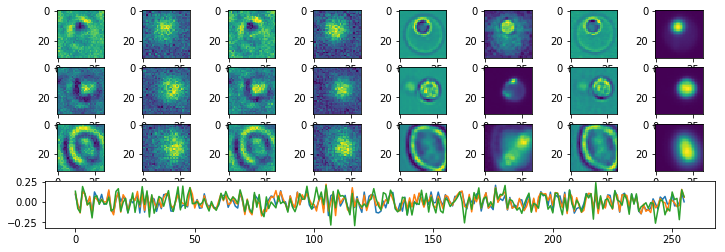

Epoch:  10 Iteration:  0 Loss:  7.25796 0.631972 0.00181839


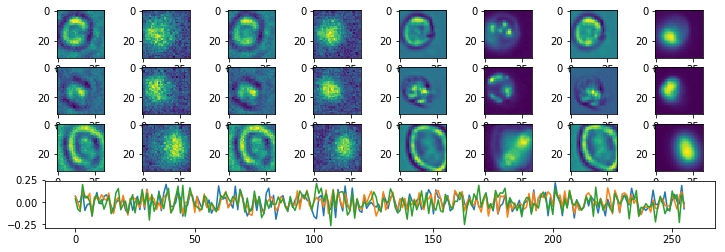

Epoch:  11 Iteration:  0 Loss:  6.73022 0.631698 0.000983745


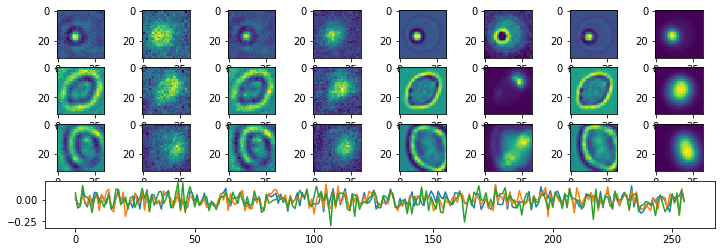

Epoch:  12 Iteration:  0 Loss:  6.55872 0.631606 0.000532538


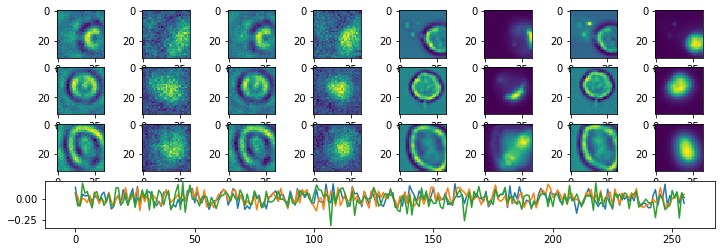

Epoch:  13 Iteration:  0 Loss:  6.34279 0.631492 0.00166208


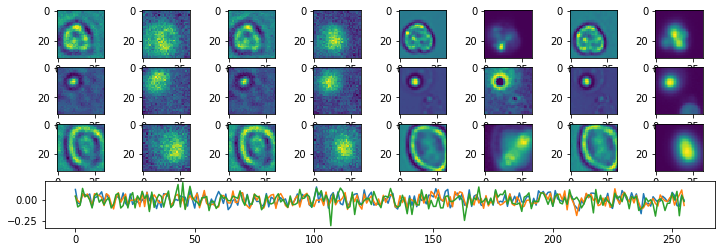

Epoch:  14 Iteration:  0 Loss:  5.98297 0.631306 0.00130233


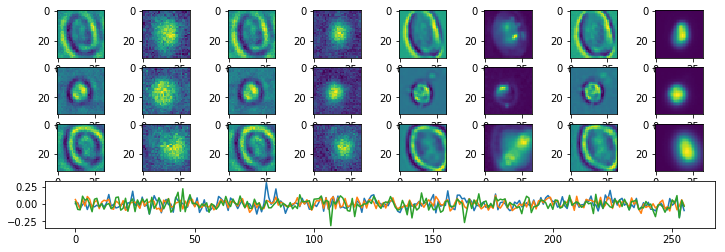

Epoch:  15 Iteration:  0 Loss:  5.97628 0.6313 0.00177771


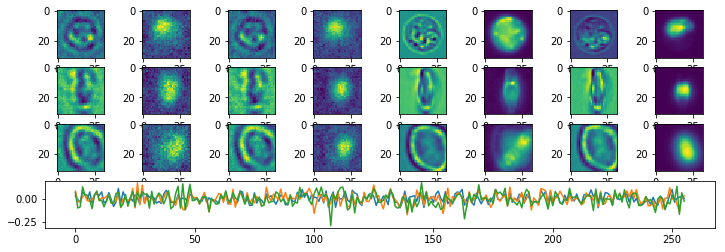

Epoch:  16 Iteration:  0 Loss:  5.6663 0.63114 0.00135261


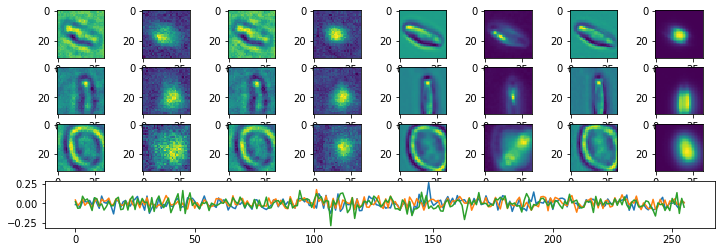

Epoch:  17 Iteration:  0 Loss:  5.45614 0.631026 0.00117788


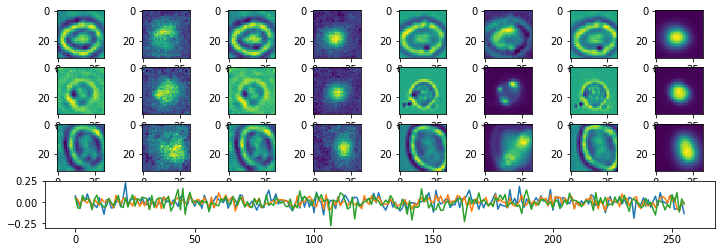

Epoch:  18 Iteration:  0 Loss:  5.21683 0.630898 0.0010829


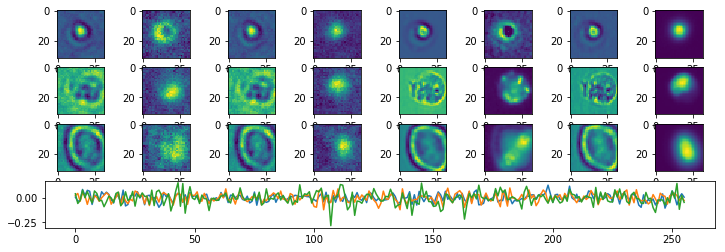

Epoch:  19 Iteration:  0 Loss:  4.99628 0.630781 0.000930637


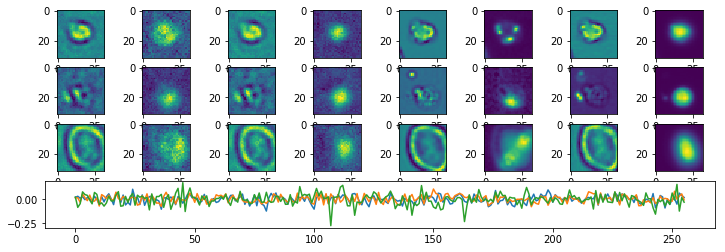

Epoch:  20 Iteration:  0 Loss:  4.8452 0.6307 0.00103262


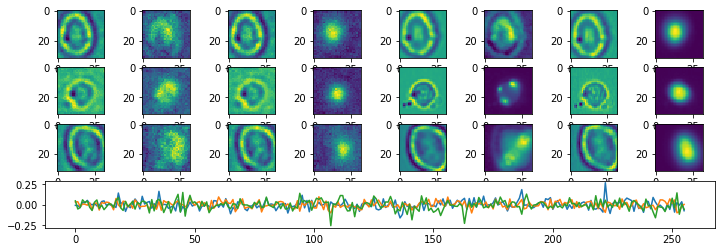

Epoch:  21 Iteration:  0 Loss:  4.72392 0.630637 0.000619143


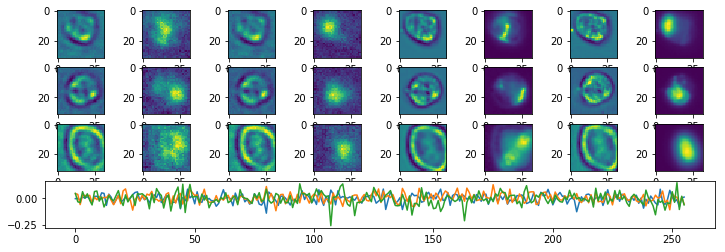

Epoch:  22 Iteration:  0 Loss:  4.61141 0.630577 0.000554562


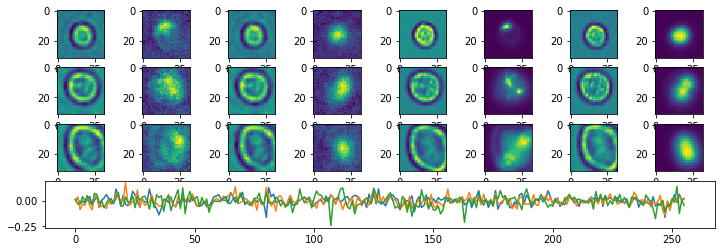

Epoch:  23 Iteration:  0 Loss:  4.48481 0.630509 0.000667781


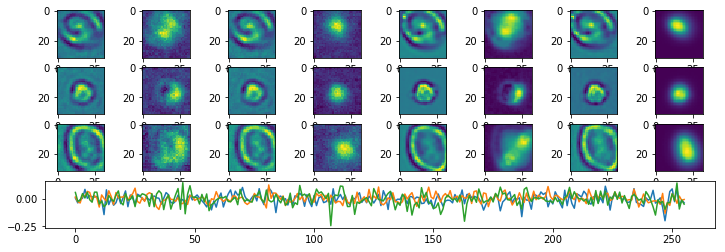

Epoch:  24 Iteration:  0 Loss:  4.4102 0.630469 0.000578403


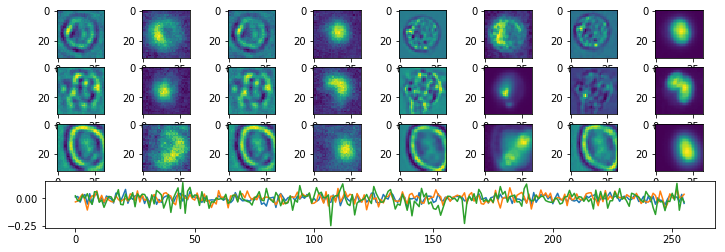

Epoch:  25 Iteration:  0 Loss:  4.36974 0.630449 0.00100943


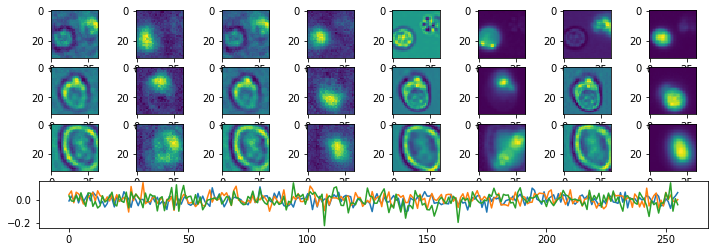

Epoch:  26 Iteration:  0 Loss:  4.21386 0.630367 0.000672549


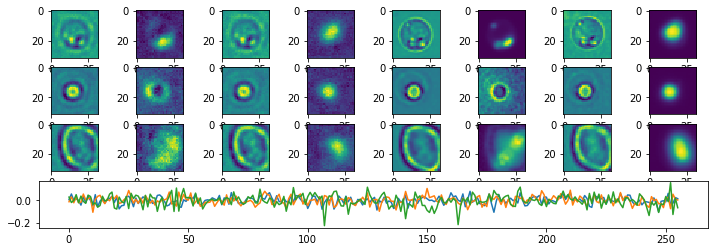

Epoch:  27 Iteration:  0 Loss:  4.1648 0.63034 0.000766665


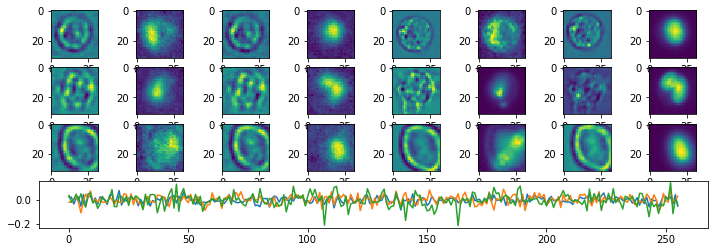

Epoch:  28 Iteration:  0 Loss:  4.08569 0.630298 0.000553399


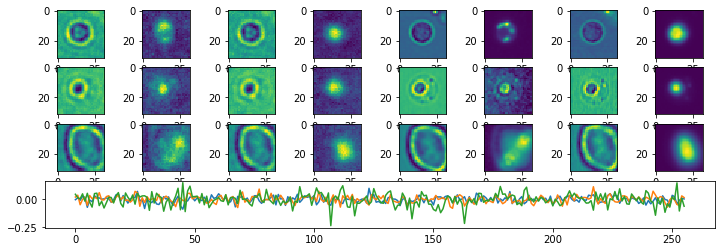

Epoch:  29 Iteration:  0 Loss:  4.00811 0.630259 0.000580251


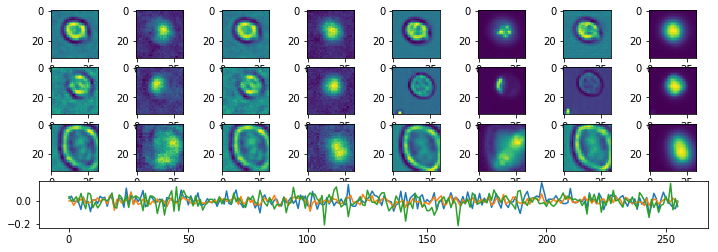

Epoch:  30 Iteration:  0 Loss:  3.97552 0.630241 0.000718087


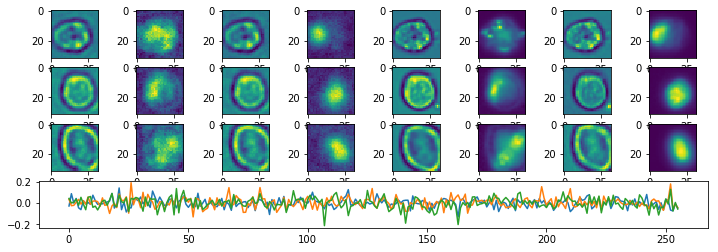

Epoch:  31 Iteration:  0 Loss:  3.9143 0.630208 0.000487745


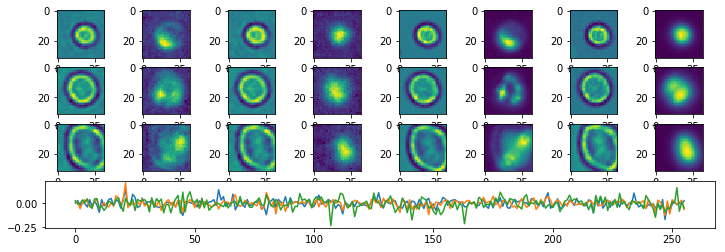

Epoch:  32 Iteration:  0 Loss:  3.84037 0.63017 0.000831842


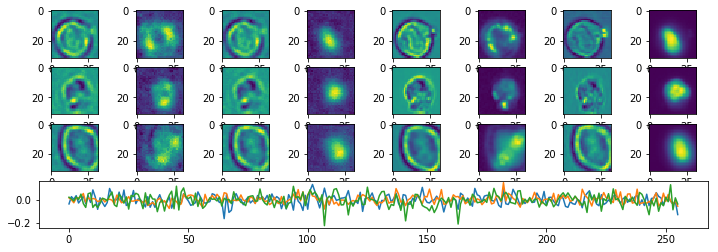

Epoch:  33 Iteration:  0 Loss:  3.81106 0.630154 0.000633329


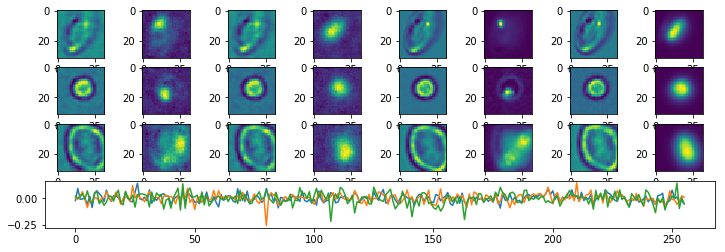

Epoch:  34 Iteration:  0 Loss:  3.72913 0.630112 0.000446945


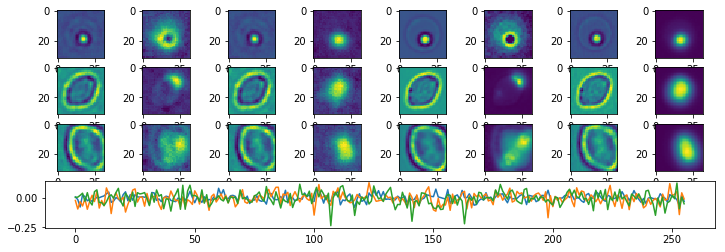

Epoch:  35 Iteration:  0 Loss:  3.71085 0.630103 0.000194758


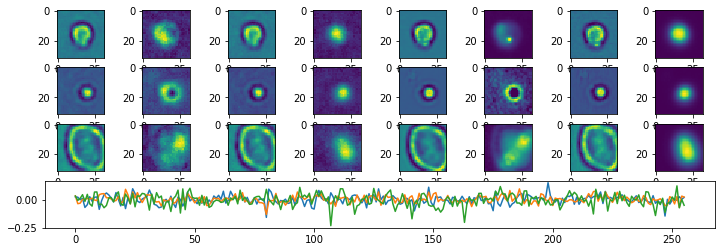

Epoch:  36 Iteration:  0 Loss:  3.61801 0.630053 0.000400782


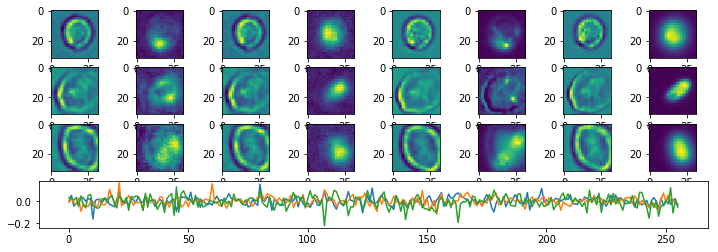

Epoch:  37 Iteration:  0 Loss:  3.58562 0.630037 0.000371277


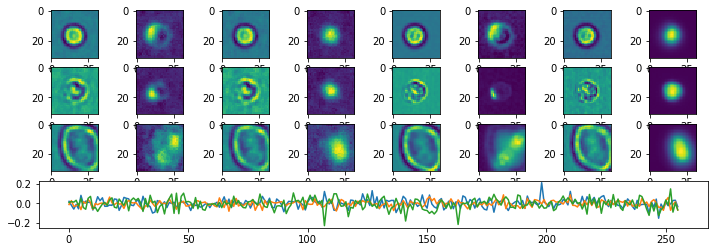

Epoch:  38 Iteration:  0 Loss:  3.53071 0.630009 0.000859946


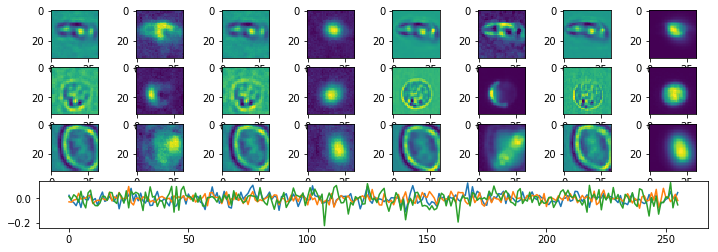

Epoch:  39 Iteration:  0 Loss:  3.44926 0.629967 0.000500351


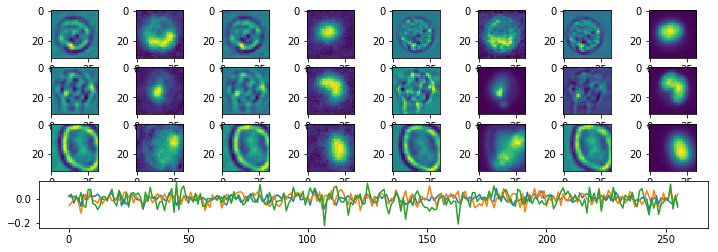

Epoch:  40 Iteration:  0 Loss:  3.41251 0.629947 0.000692427


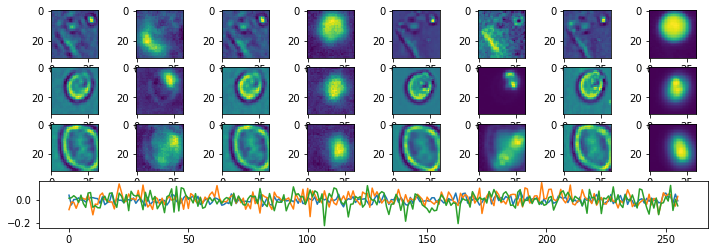

Epoch:  41 Iteration:  0 Loss:  3.34796 0.629915 0.000516444


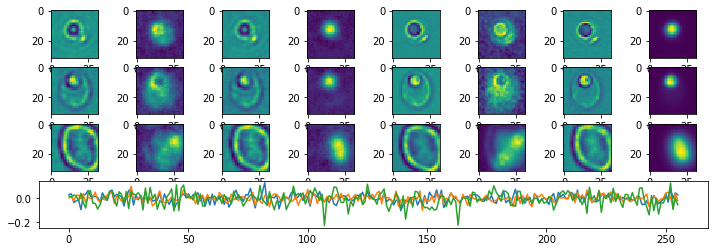

Epoch:  42 Iteration:  0 Loss:  3.35883 0.62992 0.00075376


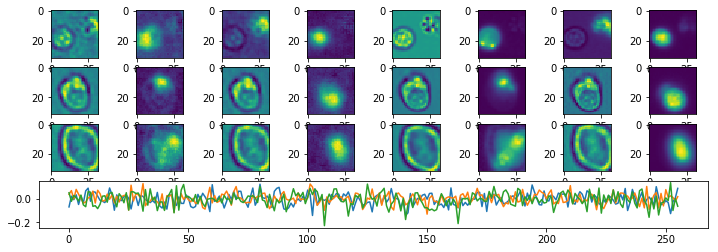

Epoch:  43 Iteration:  0 Loss:  3.29283 0.629887 0.000504404


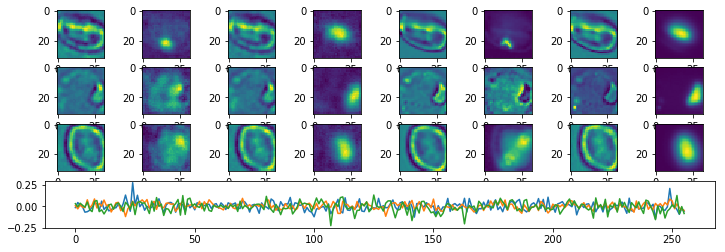

Epoch:  44 Iteration:  0 Loss:  3.24671 0.629862 0.00033325


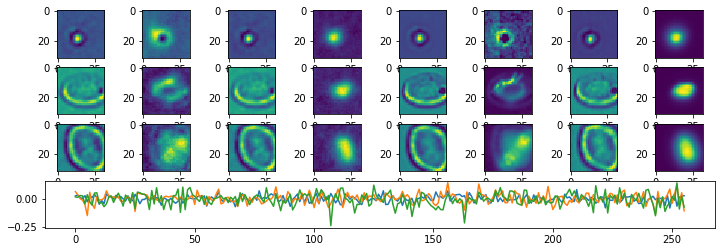

Epoch:  45 Iteration:  0 Loss:  3.20537 0.629841 0.000421375


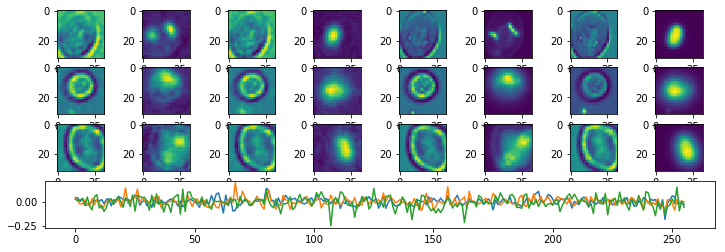

Epoch:  46 Iteration:  0 Loss:  3.17913 0.629827 0.000697583


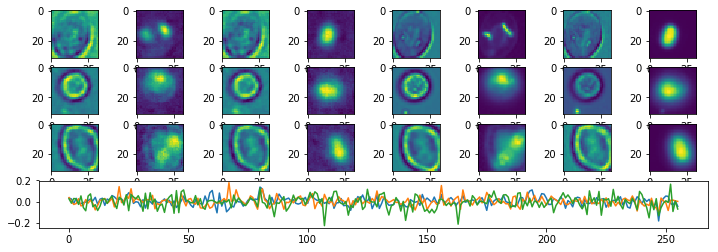

Epoch:  47 Iteration:  0 Loss:  3.12306 0.629798 0.000295073


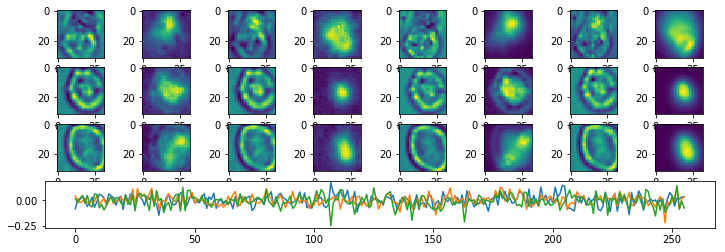

Epoch:  48 Iteration:  0 Loss:  3.12124 0.6298 0.00021565


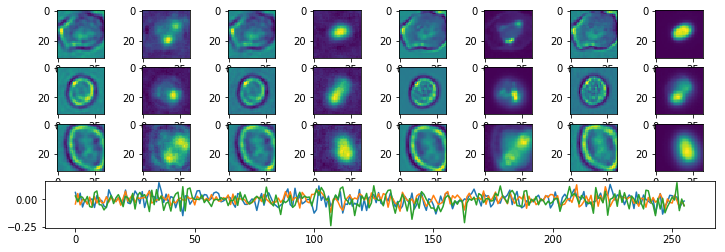

Epoch:  49 Iteration:  0 Loss:  3.0759 0.629773 0.00048393


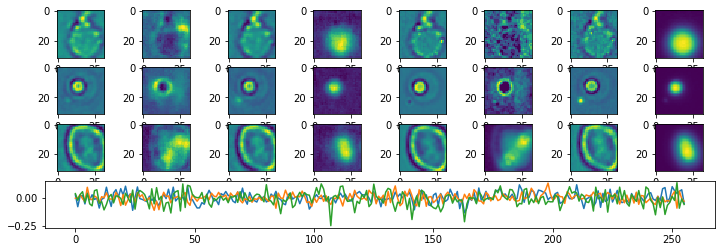

Epoch:  50 Iteration:  0 Loss:  3.04577 0.629759 0.000273913


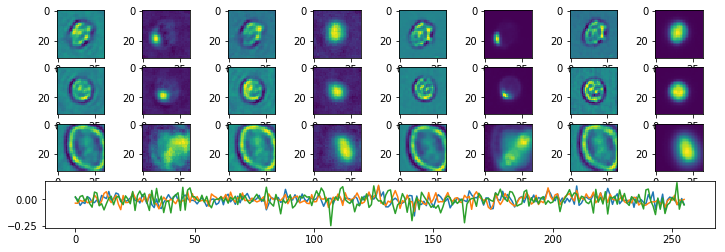

Epoch:  51 Iteration:  0 Loss:  3.0184 0.629744 0.000519305


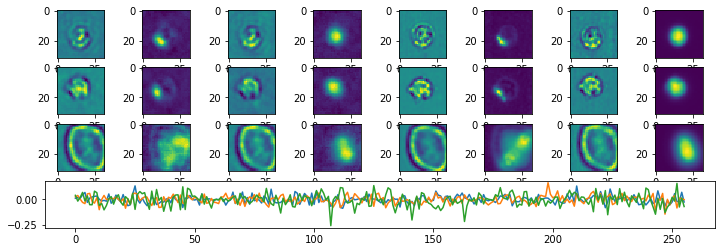

Epoch:  52 Iteration:  0 Loss:  2.99147 0.62973 0.000201315


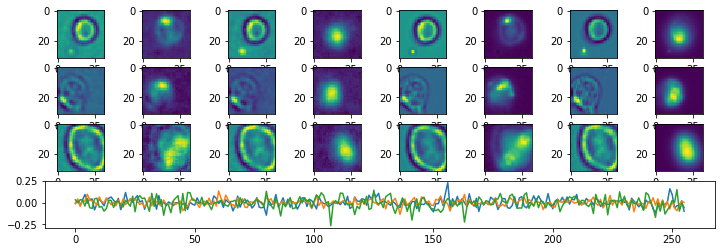

Epoch:  53 Iteration:  0 Loss:  2.96054 0.629716 0.000494391


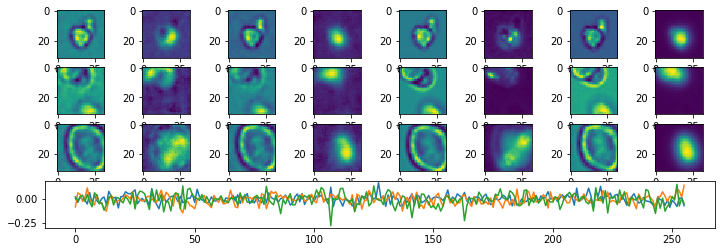

Epoch:  54 Iteration:  0 Loss:  2.93099 0.629699 0.000438005


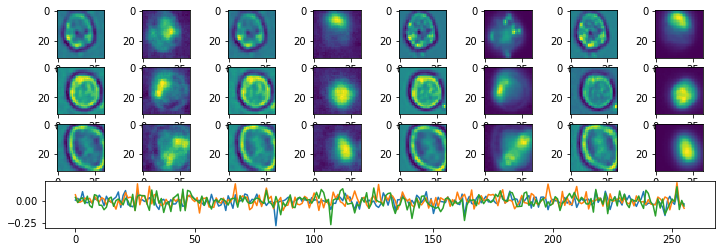

Epoch:  55 Iteration:  0 Loss:  2.88905 0.629679 0.000780046


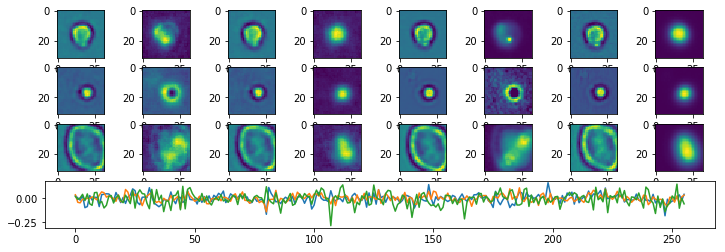

Epoch:  56 Iteration:  0 Loss:  2.86724 0.629667 0.000241756


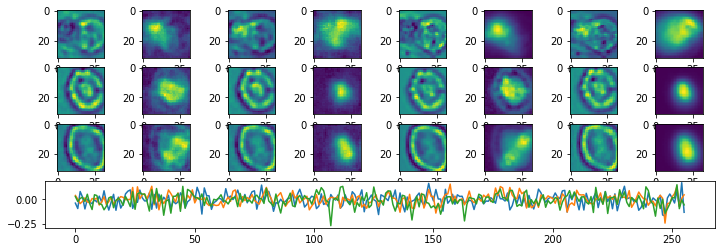

Epoch:  57 Iteration:  0 Loss:  2.82537 0.629645 0.000297099


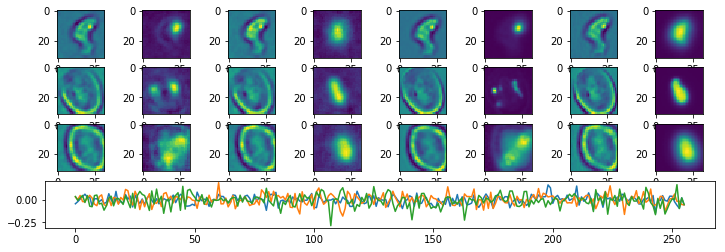

Epoch:  58 Iteration:  0 Loss:  2.7974 0.629631 0.000142276


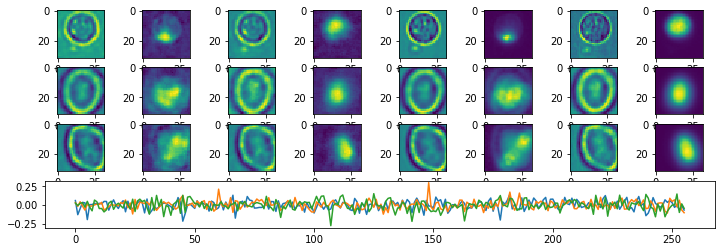

Epoch:  59 Iteration:  0 Loss:  2.76744 0.629616 0.000228226


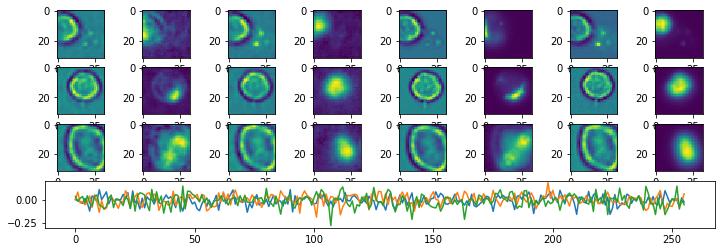

Epoch:  60 Iteration:  0 Loss:  2.76647 0.629617 0.000143468


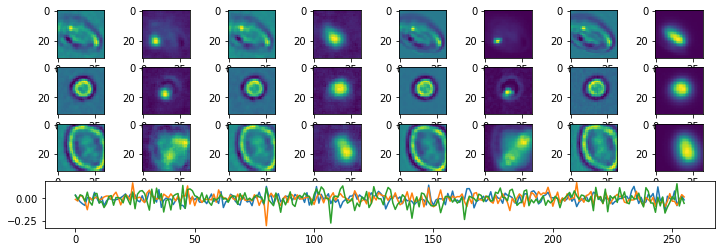

Epoch:  61 Iteration:  0 Loss:  2.72128 0.629591 0.000383109


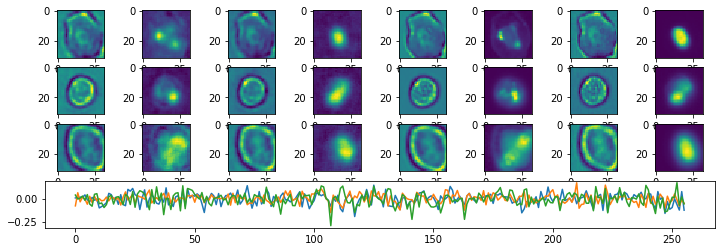

Epoch:  62 Iteration:  0 Loss:  2.69759 0.62958 0.000204206


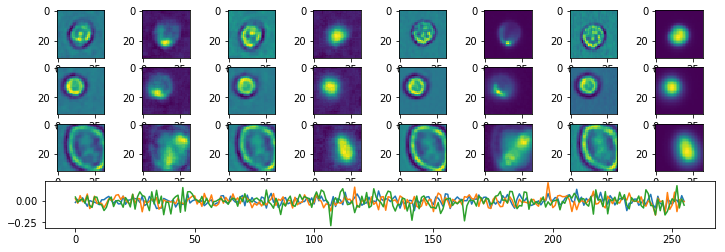

Epoch:  63 Iteration:  0 Loss:  2.71706 0.629592 0.000348687


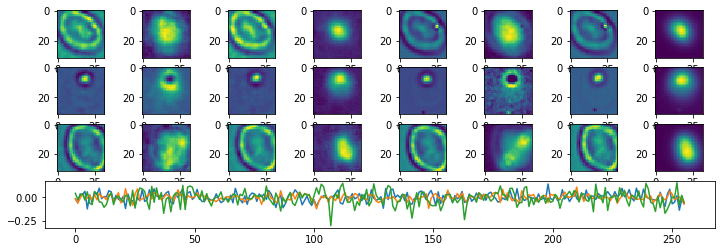

Epoch:  64 Iteration:  0 Loss:  2.68298 0.629573 0.000347316


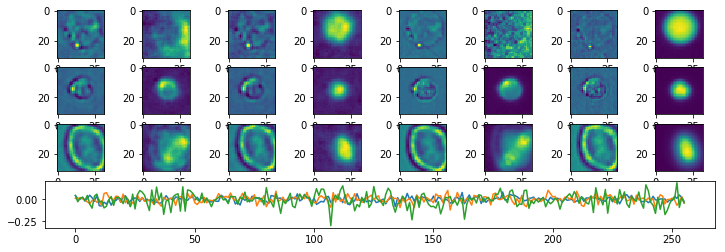

Epoch:  65 Iteration:  0 Loss:  2.66417 0.629566 0.00014773


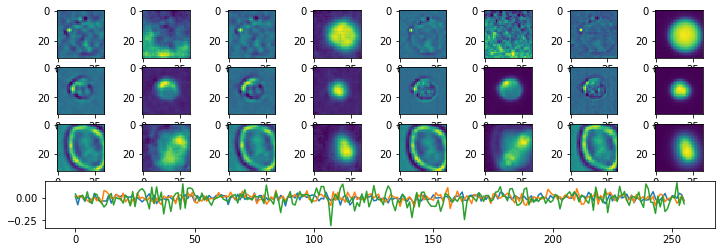

Epoch:  66 Iteration:  0 Loss:  2.62832 0.629544 0.000378609


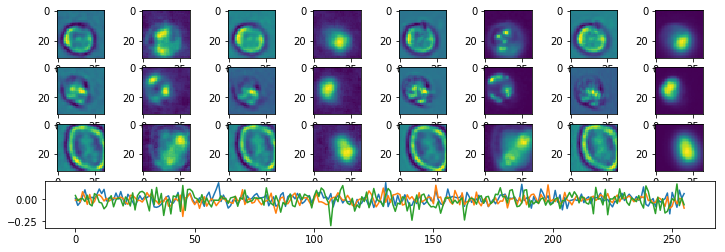

Epoch:  67 Iteration:  0 Loss:  2.62147 0.629543 0.000635773


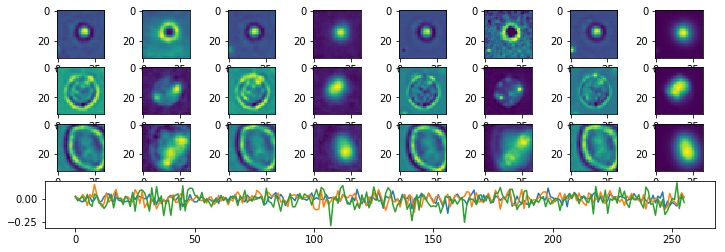

Epoch:  68 Iteration:  0 Loss:  2.59297 0.629526 0.000248492


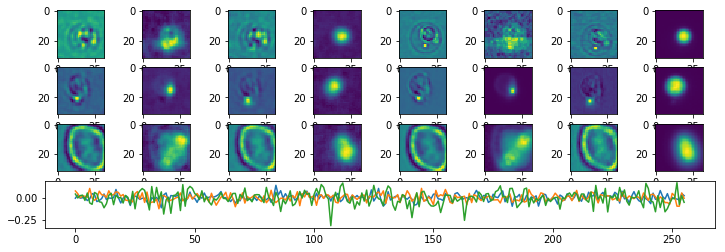

Epoch:  69 Iteration:  0 Loss:  4.27371 0.630434 0.000883937


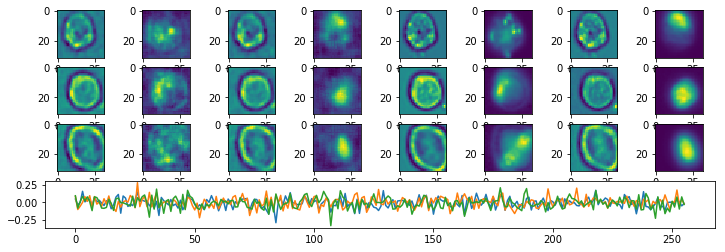

Epoch:  70 Iteration:  0 Loss:  3.15856 0.629827 0.000539243


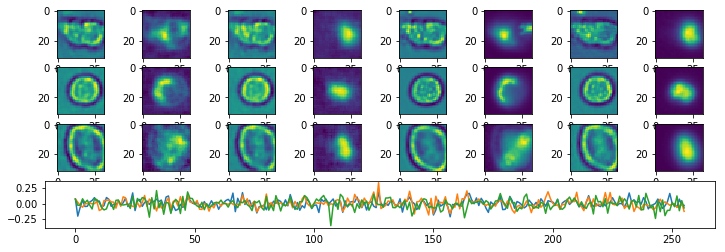

Epoch:  71 Iteration:  0 Loss:  2.94435 0.629713 0.00054425


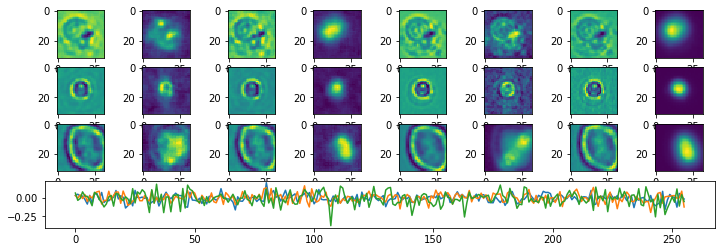

Epoch:  72 Iteration:  0 Loss:  2.88612 0.629681 0.000383139


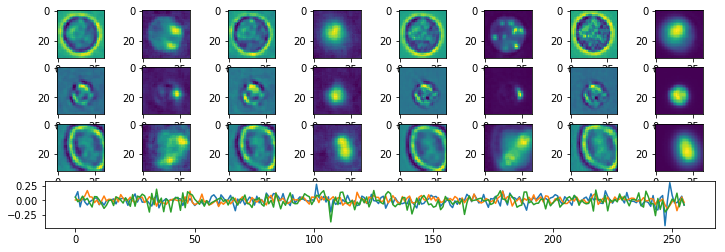

Epoch:  73 Iteration:  0 Loss:  2.81904 0.629646 0.000425309


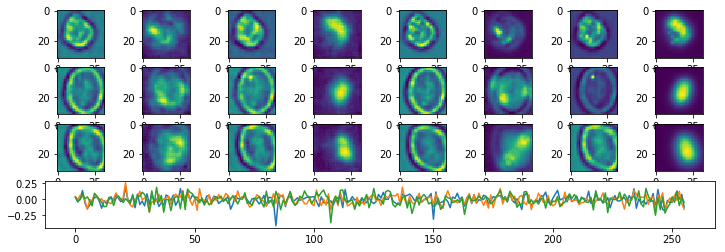

Epoch:  74 Iteration:  0 Loss:  2.78257 0.629626 0.00036484


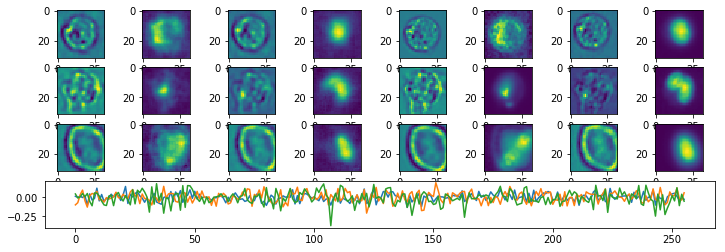

Epoch:  75 Iteration:  0 Loss:  2.72109 0.629594 0.000460953


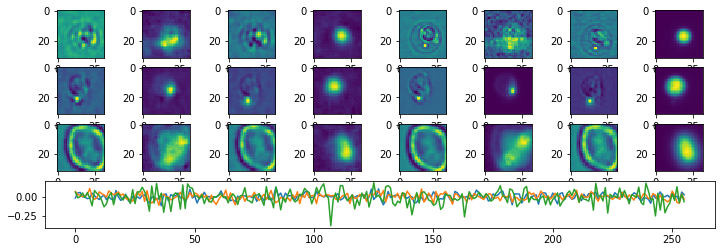

Epoch:  76 Iteration:  0 Loss:  2.69927 0.629583 0.000436395


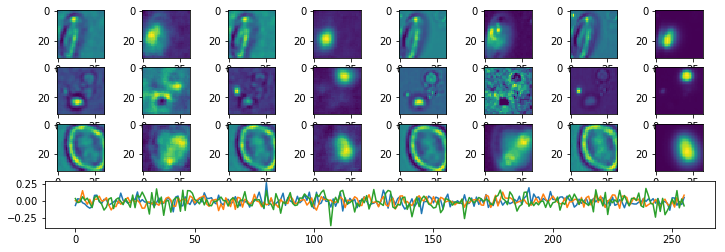

Epoch:  77 Iteration:  0 Loss:  2.67426 0.629569 0.000362724


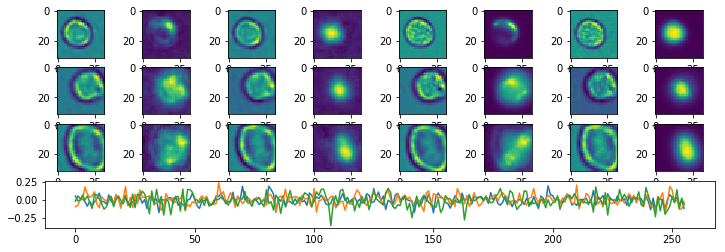

Epoch:  78 Iteration:  0 Loss:  2.67312 0.629568 0.000370264


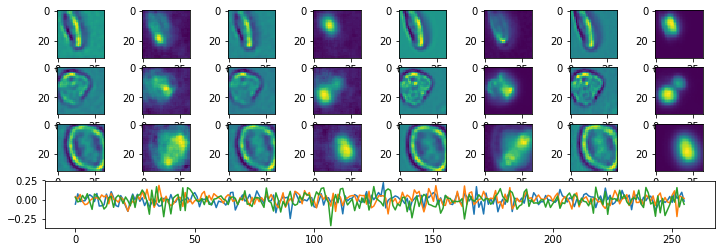

Epoch:  79 Iteration:  0 Loss:  2.64912 0.62956 0.00029251


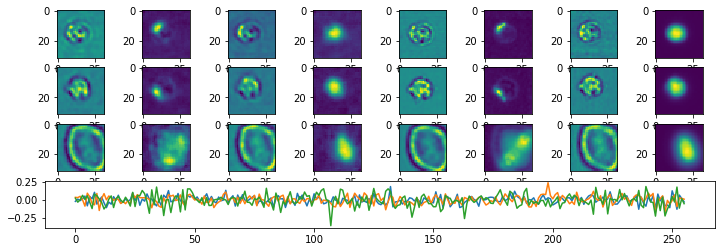

Epoch:  80 Iteration:  0 Loss:  2.62026 0.629541 0.000361532


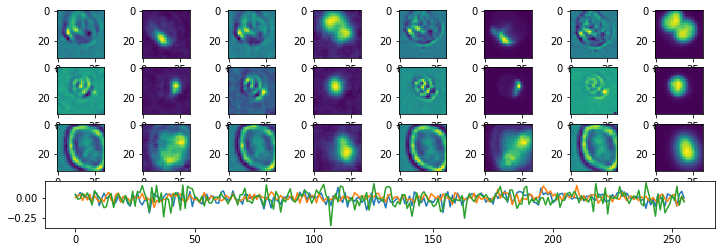

Epoch:  81 Iteration:  0 Loss:  2.62622 0.629544 0.000377089


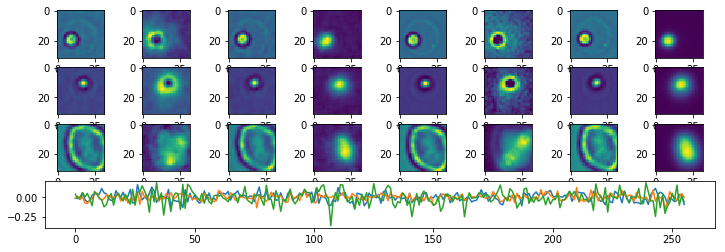

Epoch:  82 Iteration:  0 Loss:  2.62702 0.629544 0.000365138


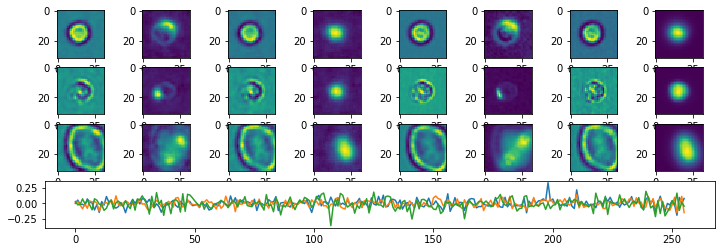

Epoch:  83 Iteration:  0 Loss:  2.60402 0.629532 0.000426769


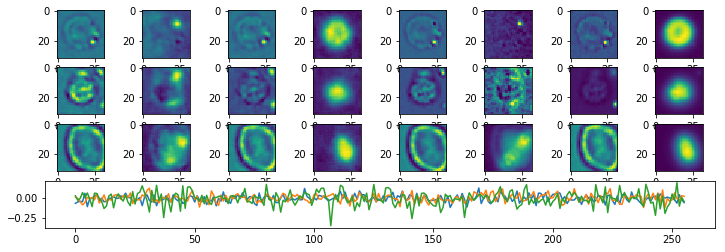

Epoch:  84 Iteration:  0 Loss:  2.58827 0.629523 0.000441432


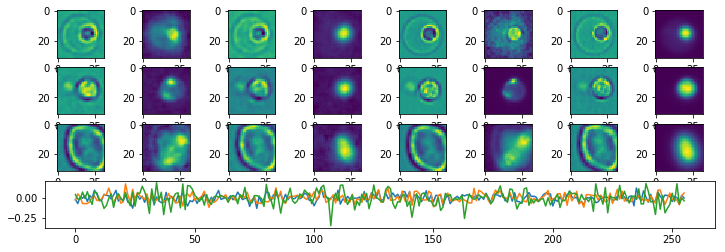

Epoch:  85 Iteration:  0 Loss:  2.57957 0.629526 0.000422746


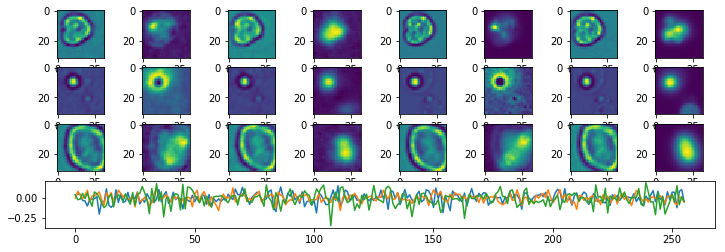

Epoch:  86 Iteration:  0 Loss:  2.5949 0.629527 0.000492334


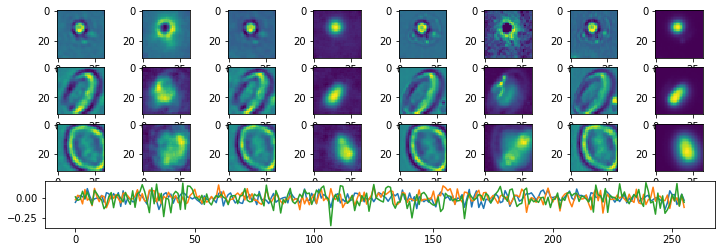

Epoch:  87 Iteration:  0 Loss:  2.5607 0.629509 0.000419408


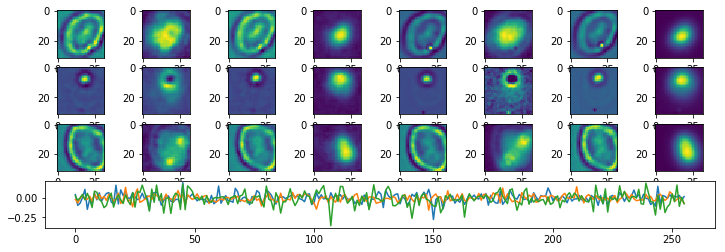

Epoch:  88 Iteration:  0 Loss:  2.57359 0.629516 0.000479639


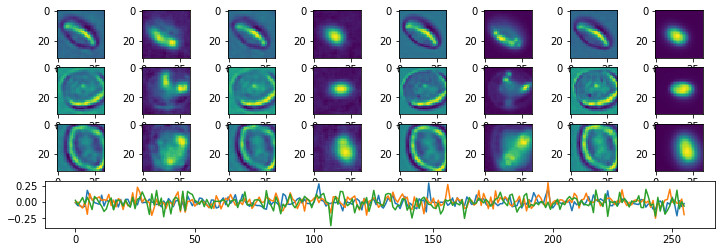

Epoch:  89 Iteration:  0 Loss:  2.57176 0.629515 0.000341505


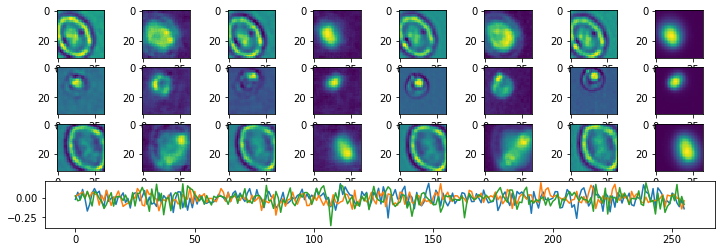

Epoch:  90 Iteration:  0 Loss:  2.54975 0.629504 0.000449747


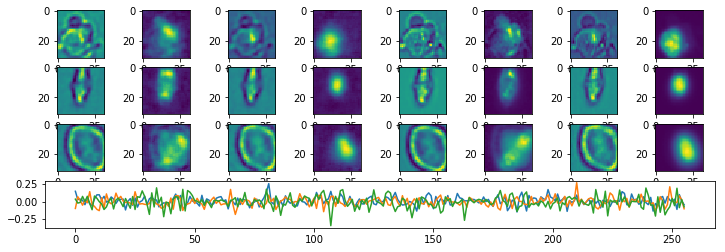

Epoch:  91 Iteration:  0 Loss:  2.53386 0.629495 0.000287414


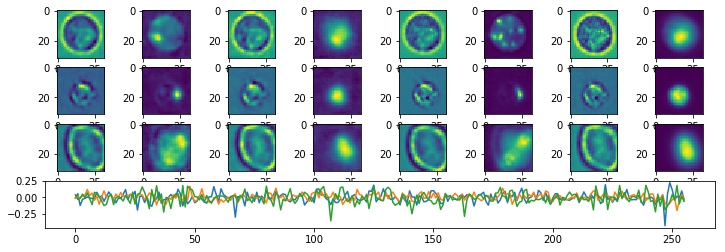

Epoch:  92 Iteration:  0 Loss:  2.52806 0.629493 0.000378311


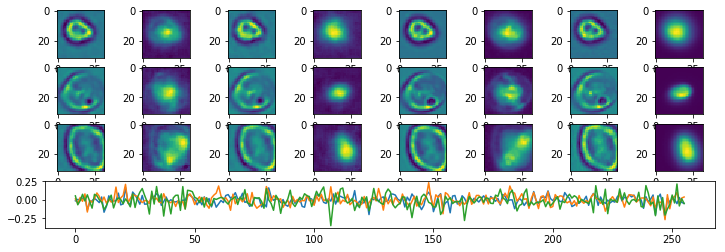

Epoch:  93 Iteration:  0 Loss:  2.5173 0.629487 0.000294626


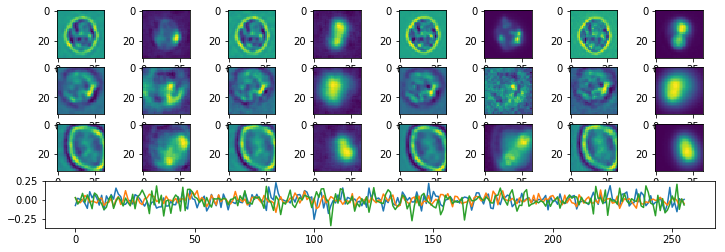

Epoch:  94 Iteration:  0 Loss:  2.51916 0.629488 0.000535488


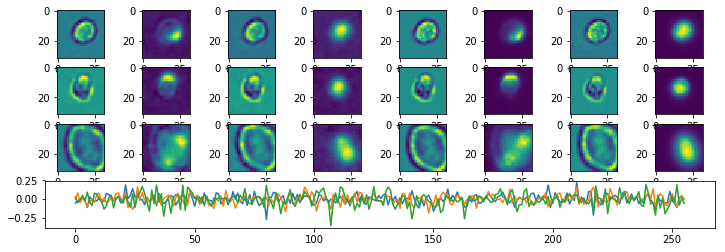

Epoch:  95 Iteration:  0 Loss:  2.50266 0.629478 0.000499666


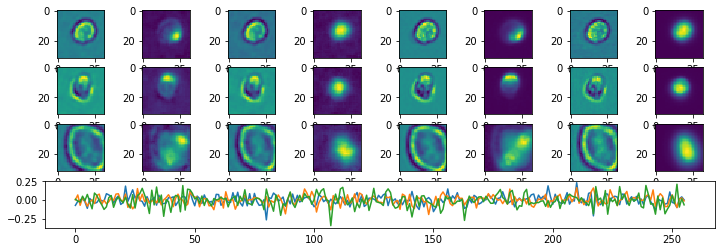

Epoch:  96 Iteration:  0 Loss:  2.49437 0.629478 1.63615e-05


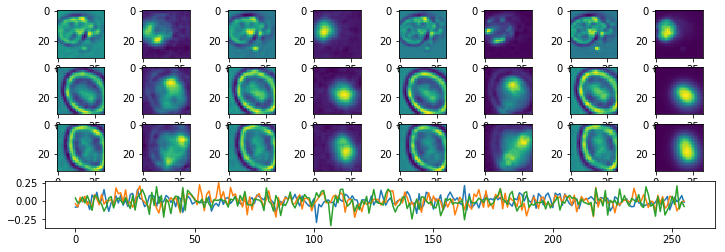

Epoch:  97 Iteration:  0 Loss:  2.49306 0.629474 0.000670671


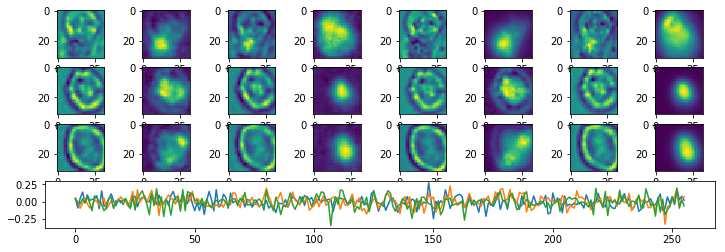

Epoch:  98 Iteration:  0 Loss:  2.47823 0.629467 0.000465333


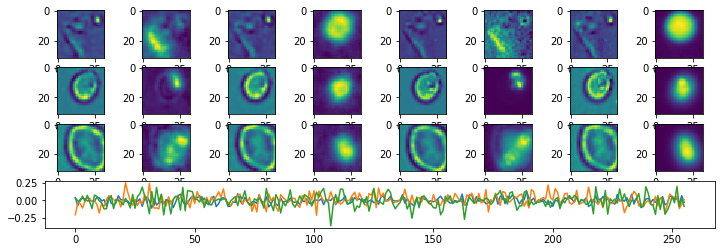

Epoch:  99 Iteration:  0 Loss:  2.46727 0.629461 0.00052911


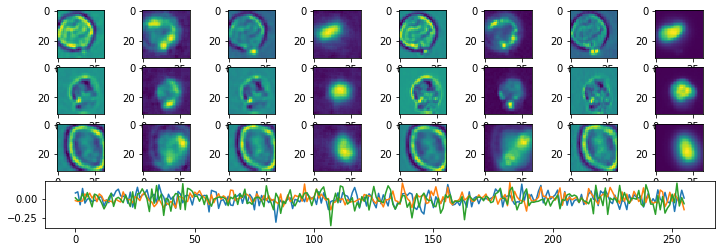

Epoch:  100 Iteration:  0 Loss:  2.45418 0.629454 0.000124723


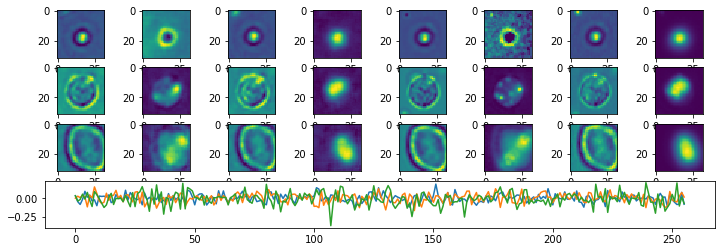

Epoch:  101 Iteration:  0 Loss:  2.46392 0.62946 0.000375986


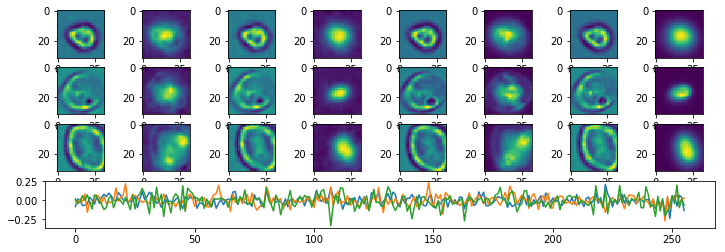

Epoch:  102 Iteration:  0 Loss:  2.67198 0.629582 9.41753e-06


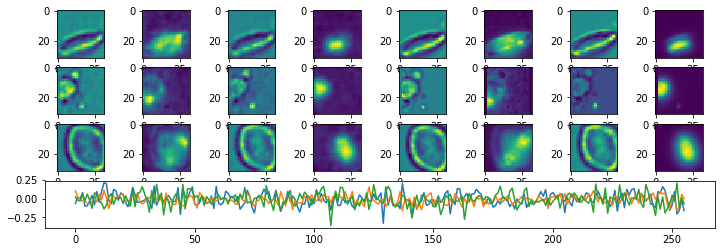

Epoch:  103 Iteration:  0 Loss:  2.42985 0.629445 5.96642e-05


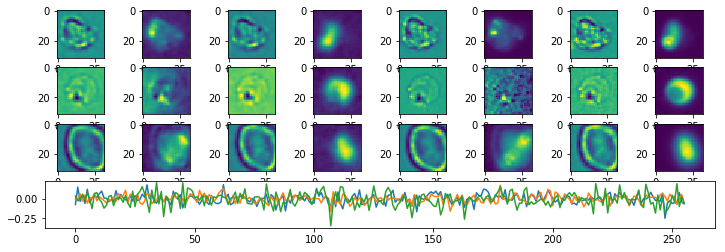

Epoch:  104 Iteration:  0 Loss:  2.41767 0.629436 0.000130206


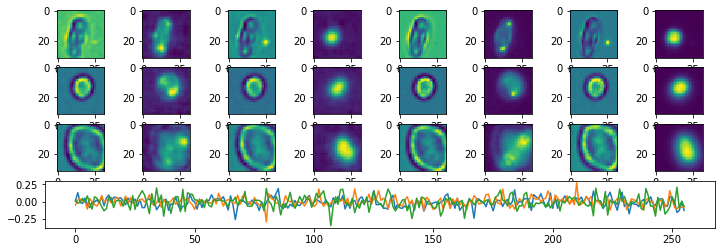

Epoch:  105 Iteration:  0 Loss:  2.44029 0.629447 0.000577182


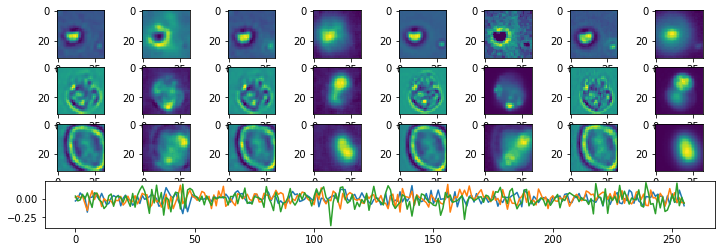

Epoch:  106 Iteration:  0 Loss:  2.39812 0.629425 0.000184536


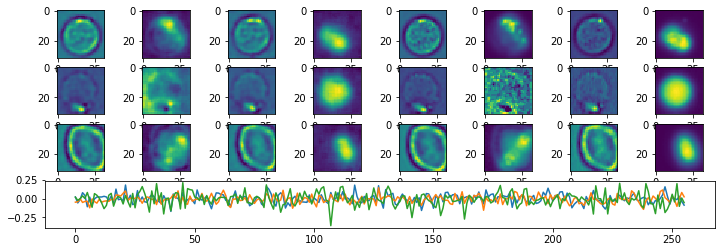

Epoch:  107 Iteration:  0 Loss:  2.40112 0.629431 0.00017935


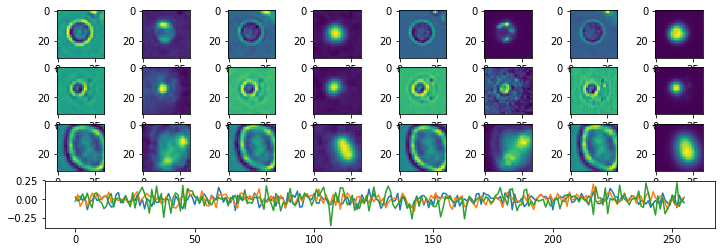

Epoch:  108 Iteration:  0 Loss:  2.37119 0.629411 0.000297874


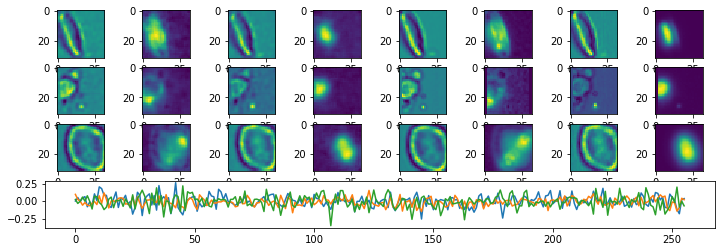

Epoch:  109 Iteration:  0 Loss:  117.05 0.700808 0.011061


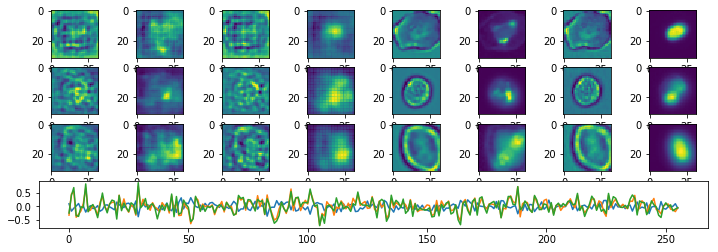

Epoch:  110 Iteration:  0 Loss:  3.35947 0.629927 0.000711322


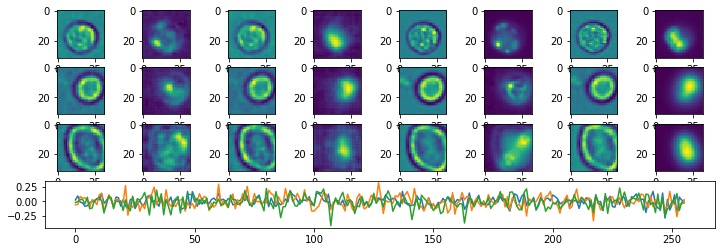

Epoch:  111 Iteration:  0 Loss:  2.97499 0.629728 0.000433058


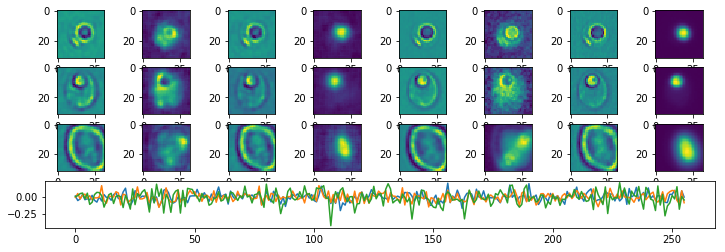

Epoch:  112 Iteration:  0 Loss:  2.8137 0.629643 0.000460953


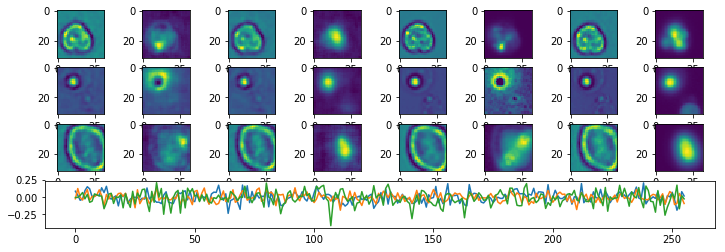

Epoch:  113 Iteration:  0 Loss:  2.68347 0.629574 0.00038147


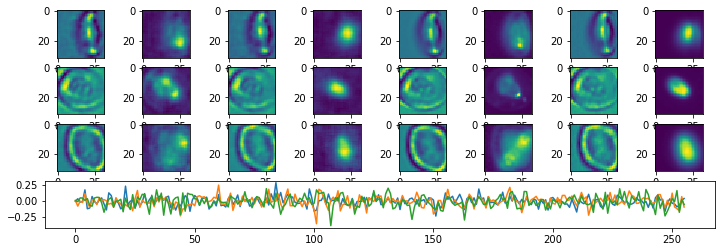

Epoch:  114 Iteration:  0 Loss:  2.6514 0.629561 0.000428677


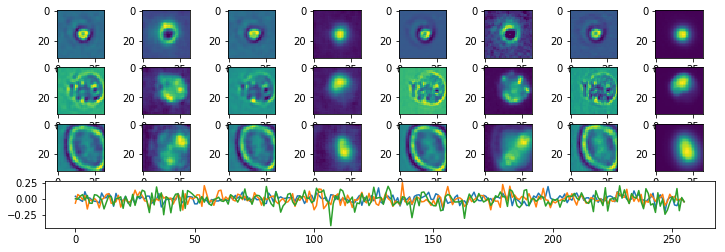

Epoch:  115 Iteration:  0 Loss:  2.62491 0.629549 0.000392467


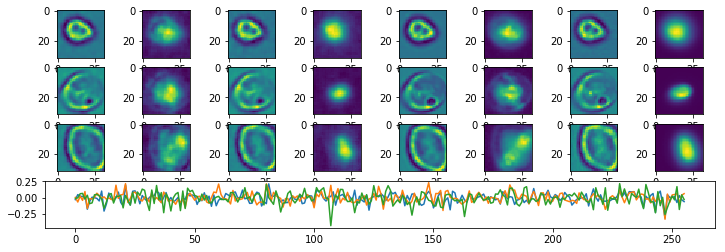

Epoch:  116 Iteration:  0 Loss:  2.59381 0.629528 0.000241488


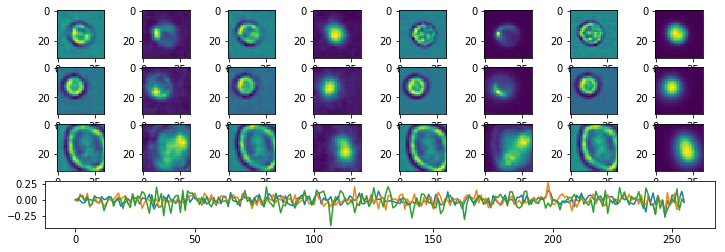

Epoch:  117 Iteration:  0 Loss:  2.53643 0.629497 0.000275075


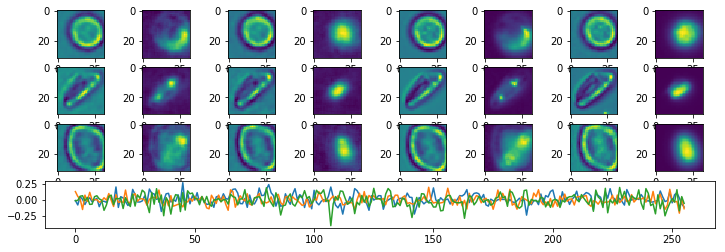

Epoch:  118 Iteration:  0 Loss:  2.51505 0.629486 0.00023213


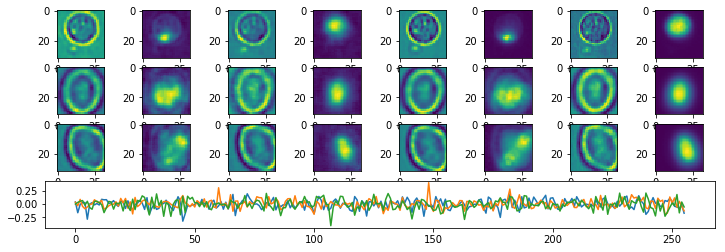

Epoch:  119 Iteration:  0 Loss:  2.51815 0.629488 0.000332355


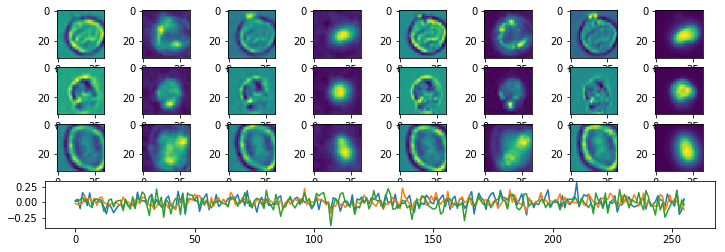

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-18-Chs-0-1-3-4_32_mmFromTifs3"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4